In [191]:
import os

import numpy as np
from sklearn.linear_model import LinearRegression

from ultralytics import YOLO
from tqdm.notebook import tqdm

import matplotlib.pyplot as plt
import matplotlib.patches as patches

%matplotlib inline

In [2]:
model = YOLO("models/26_6_2024_shampoo_5_class.pt")

In [318]:
def _is_image(f: str) -> bool:
    return any(f.lower().endswith(ext) for ext in {".png", ".jpg", ".jpeg"})

def get_sources(root: str, n: int | None = None) -> list[str]:
    files = os.listdir(root)
    files = map(lambda f: os.path.join(root, f), files)
    files = list(filter(_is_image, files))
    
    if n is not None:
        files = files[:min(len(files), n)]    
    return files

sources0 = get_sources("data/eyeshift/0/", n=300)  # TODO wrap inside DataFrame/PyTorch Dataset
sources1 = get_sources("data/eyeshift/1/", n=300)

In [319]:
results0 = [model(src, conf=0.3, classes=[1, 2, 4], verbose=False)[0] for src in tqdm(sources0)]
results1 = [model(src, conf=0.3, classes=[1, 2, 4], verbose=False)[0] for src in tqdm(sources1)]

  0%|          | 0/300 [00:00<?, ?it/s]

KeyboardInterrupt: 

In [294]:
class_names = {"cut" : 0,
               "eye_patch" : 1,
               "horizontal" : 2,
               "shampoo" : 3,
               "vertical" : 4}

labels = {0: True,
          1: False}

In [315]:
ALPHA = 0.85


def _check_in_between(val: float, mean: float, spread: float, alpha: float = 1) -> bool:
    return mean - spread * alpha <= val <= mean + spread * alpha

def is_batch_defective(r):
    horizontals = r.boxes[r.boxes.cls == class_names["horizontal"]].numpy()
    eye_patches = r.boxes[r.boxes.cls == class_names["eye_patch"]].numpy()

    if len(eye_patches) == 0:
        return None
    
    rows = [horizontals[horizontals.xywh[:, 1] < 300],
            horizontals[horizontals.xywh[:, 1] >= 300]]  # TODO unsupervised clustering model?
    rows = [row for row in rows if len(row) > 0]
    row_heights = [row.xywh[:, -1].mean() / 2 for row in rows]
    row_ceil = [row.xyxy[:, -1].max() for row in rows]
    row_floor = [row.xyxy[:, 1].min() for row in rows]
    
    row_positions = np.array([row.xywh[:, 1].mean() for row in rows])
    if len(row_positions) == 0:
        return True

    row_samples = [np.vstack((row.xyxy[:, :2], row.xyxy[:, 2:], row.xyxy[:, (2, 1)], row.xyxy[:, (0, -1)])) for row in rows]
    reg = [LinearRegression().fit(row.T[0].reshape(-1, 1), row.T[1]) for row in row_samples]

    # verticals = r.boxes[r.boxes.cls == class_names["vertical"]].numpy()
    # avg_w = verticals.xywh[:, 2].mean() * 2 / 2
    
    for (x, y, _, _) in eye_patches.xywh:
        # inside_column = any((x <= verticals.xywh[:, 0] + avg_w) & (x >= verticals.xywh[:, 0] - avg_w))
        # if not inside_column:
        #     return True
        
        # row_is_undetected = abs(y - row_positions).min() > 250
        # if row_is_undetected:
        #     return None

        # inside_row = any(row_floor[r] <= y <= row_ceil[r] for r in range(len(rows)))
        # inside_row = any(_check_in_between(y, row_positions[r], row_heights[r]) for r in range(len(rows)))
        inside_row = any(_check_in_between(y, reg[r].predict([[x]]), row_heights[r], alpha=ALPHA) for r in range(len(rows)))
        if not inside_row:
            return True
        
    return False

In [316]:
def test_classifier(results, label: bool, verbose: bool = True):
    wrong = []
    total = 0

    for i, r in enumerate(results):
        if (pred := is_batch_defective(r)) is None:
            continue
            
        total += 1
        if pred != label:
            wrong.append(i)
    
    if verbose:
        print(f"Incorrect: {len(wrong)}/{total} or {100 * len(wrong) / total:.2f}%")
    return wrong, total

wrong0, total0 = test_classifier(results0, labels[0])
wrong1, total1 = test_classifier(results1, labels[1])
print(f"Accuracy: {100 - 100 * (len(wrong0) + len(wrong1)) / (total0 + total1):.2f}%")

Incorrect: 29/279 or 10.39%
Incorrect: 29/281 or 10.32%
Accuracy: 89.64%


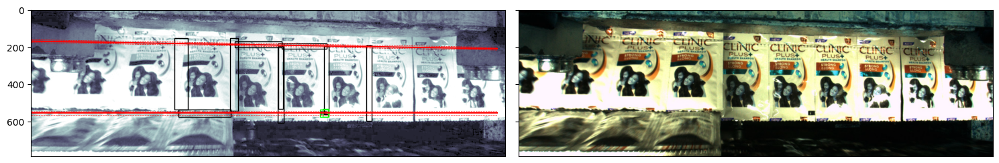

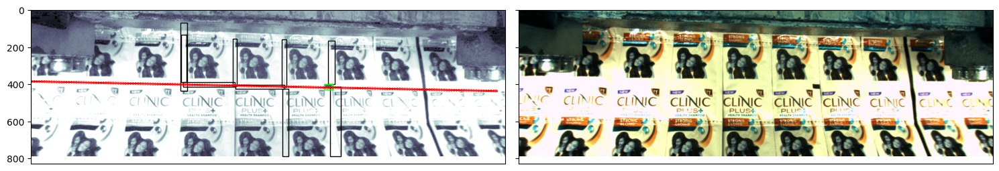

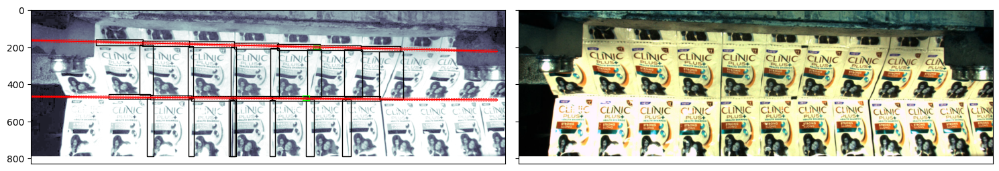

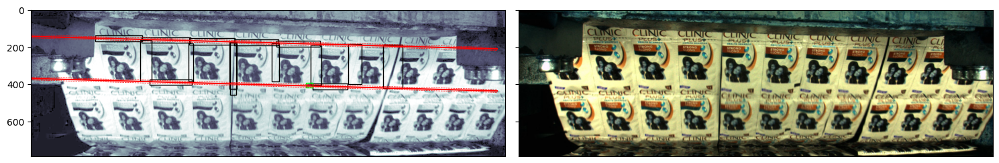

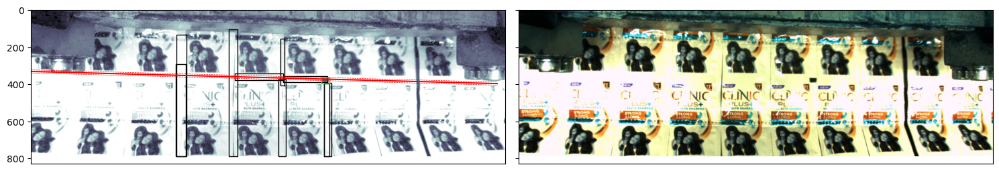

...

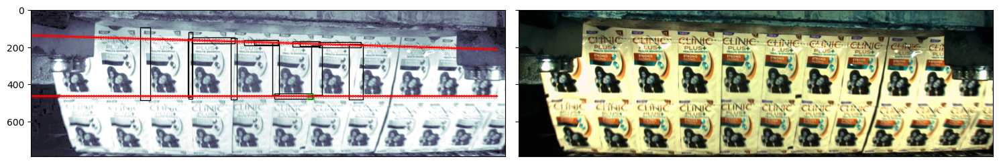

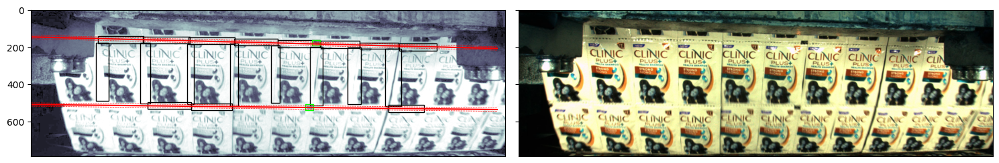

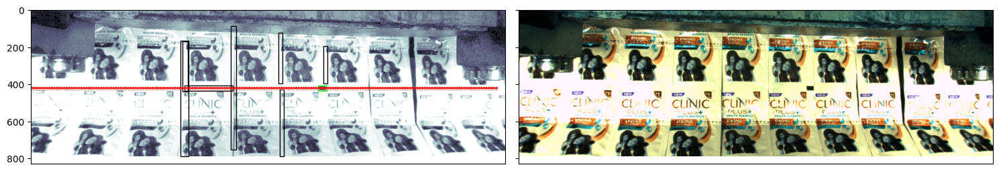

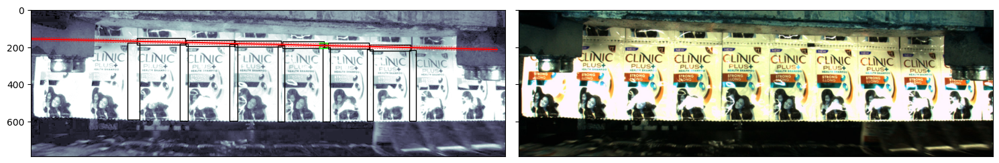

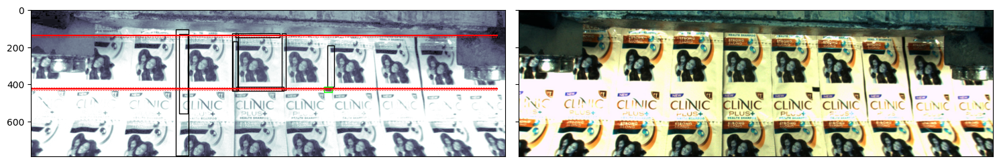

In [314]:
def plot_img(img, ax, cmap="bone", **kwargs):
    ax.xaxis.set_visible(False)
    # ax.yaxis.set_visible(False)
    ax.imshow(img, cmap=cmap, **kwargs)
    

def plot_rectangle(p, ax, **kwargs):
    x1, y1, x2, y2 = p
    ax.add_patch(patches.Rectangle((x1, y1), x2 - x1, y2 - y1, facecolor="none", **kwargs))
    

def plot_errors(wrongs, results, n=10):
    for k in wrongs[:min(n, len(wrongs))]:
        r = results[k]
        
        _, (ax1, ax2) = plt.subplots(ncols=2, figsize=(15, 12), sharey=True, sharex=True)
        plot_img(r.orig_img[:, :, 0] ** 0.4, ax1)
        plot_img(r.orig_img, ax2)
    
        classes = r.boxes.cls
        verticals = r.boxes[classes == class_names["vertical"]].numpy()
        horizontals = r.boxes[classes == class_names["horizontal"]].numpy()
        eye_patches = r.boxes[classes == class_names["eye_patch"]].numpy()
    
        for pos in horizontals.xyxy:
            plot_rectangle(pos, ax1, edgecolor="black")
            
        for pos in verticals.xyxy:
            plot_rectangle(pos, ax1, edgecolor="black")
    
        for pos in eye_patches.xyxy:
            plot_rectangle(pos, ax1, edgecolor="red" if is_batch_defective(r) else "lime")

        rows = [horizontals[horizontals.xywh[:, 1] < 300],
                horizontals[horizontals.xywh[:, 1] >= 300]]
        rows = [row for row in rows if len(row) > 0]
        row_heights = [ALPHA * row.xywh[:, -1].mean() / 2 for row in rows]
        points = [np.vstack((row.xyxy[:, :2], row.xyxy[:, 2:], row.xyxy[:, (2, 1)], row.xyxy[:, (0, -1)])) for row in rows]
        reg = [LinearRegression().fit(row.T[0].reshape(-1, 1), row.T[1]) for row in points]
        
        x = np.linspace(0, 2500, num=2).reshape(-1, 1)
        reg = [row.predict(x) for row in reg]
        for r in range(len(reg)):
            ax1.plot(x, reg[r], color="red")
            ax1.plot(x, reg[r] - row_heights[r], color="red", linestyle="--", linewidth=0.5)
            ax1.plot(x, reg[r] + row_heights[r], color="red", linestyle="--", linewidth=0.5)
    
        plt.tight_layout()
        plt.show()
        

plot_errors(wrong0, results0, n=30)

In [287]:
results0[0].show()